# Table of Content
1. [Project Overview](#1)
2. [Data Acquisition and Cleaning](#2)
    1. [Data Processing](#2.2)

3. [Visualizations for Research Questions](#3)
    1. [Which category has the most views, comment, likes, and dislikes? Which has the least](#3.1)
    2. [For the United states and the Great Britain, the users like which category's videos most?](#3.2)
    4. [The total views of each of the top 10 channels in the first two quarters in 2018](#3.3)
    5. [For each category, how long it takes, on average, for a video to become trendy](#3.4)
    6. [How long does a video stay in trending in each category?](#3.5)
    7. [What are correlations between dataset variables?](#3.6)
    8. [What does Likes vs dislikes distribution look like?](#3.7)
    9. [What are the keywords in trending video's titles?](#3.8)
4. [Regression Model¶](#4)
    1. [Correlations between Independent Variables and Tranding Days](#4.1)
    2. [Descriptive Statistics](#4.2)
    3. [Residuals vs. Fitted Values](#4.3)
5. [Business Value Matrix](#5)
6. [Conclusion](#6)
7. [Reference](#7)
<a id='1'><a>
    


# 1. Project Overview

YouTube is the largest video sharing and hosting website nowadays. It has profoundly influenced people’s daily life, including the way of receiving and sharing information on a worldwide scale. Therefore, analyzing YouTube dataset becomes significant for companies to get an insight into how social media trends have a significant impact on changing the traditional way of advertising commercial products or build a brand recognition through the embedded advertising in a new form in YouTube videos. With that, we can make a prediction, which will be used for mapping out the future strategic business planning and resource mobilization.

Our overall objectives are investors and advertisers. We will provide business recommendations for these two types of users, including which channels have more business value and what topics people are interested in now.

### We provide buesiness recommendations or advertisor and investor by the following steps:

1.   Identify the channels that created the most trendy videos in the past.
2.   Quantify the value of each channel on a scale from 1 to 10 and sort channel rankings by number of trendy video.
3.   Sort the channel with the least like-dislike ratios.
4.   Sort the channel by how long it takes to become trendy on average 
<a id='2'><a>

## 2. Data Acquisition and Cleaning 
We collected the data day by day and each day the data file we saved contains 200 records. There are about 4000+ observations with 20+ CSV files so far, but we will keep scraping data from Youtube trending data. Our sample dataset has 15 columns, which include:

- Video_id: the unique identity of a video
- Trending_date: the date that video is ranked
- Title: the title of video of the video
- Channel_title: the title of the channel which the video belongs to
- Category_id: the category of video, which can be looked up using the included JSON files
- Publish_time: the time video was published
- Tags: the tags a video contains
- Views: the number of views each video have
- Likes: the number of like each video have
- Dislikes: the number of dislikes each video have
- Comment_count: the number of comment each video have
- Thumbnail_link: the link connected to the cover page
- Comments_disabled: if people can leave comments or not
- Ratings_disabled: if people can rate the video or not
- Description: description of the video
<a id='2.2'><a>

#### A. Data Processing

First of all, we need to find the categories name to index the real category of each video. Second, there are two columns have datetime value but not format as datetime, so we need to convert it to datetime. We check the dataset and NAs, and there are several rows with only ‘video_id ’ exist but other columns show as NAs, so we fill NAs with unavailable. In this way, when we conduct culculation the Unavaliable won't be counted in the total value. Then there are still some NAs existing in ‘Description’ due to the restriction by channels and that does not affect our analysis so we keep it in our dataset and replace the NAs with 'Unavailable' as well. In addition, there are some 0 between these numeric variables, but in general these cannot be 0, so we will check what happen to them, and we found restriction on these attributes.

- Replace null values generated during scraping with 'Unavailable' and corrected time format
- Pair the category ids with their names for further analysis
- Dropped useless columns and removed unknown values which are shown as 0 in the data
- Removed the columns that won't be used in this analysis

In [40]:
import pandas as pd
import numpy as np
import datetime
from pandas import DataFrame
import requests
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import seaborn as sns
import os
from collections import Counter
from matplotlib import cm
import pylab as plot
import json
import plotly.express as px
import plotly.figure_factory as ff
import plotly.offline as py
import statsmodels.api as sm
import scipy.stats as st
from math import pi
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures
from ipywidgets import interact, interactive, fixed, interact_manual

In [41]:
#Abstarct the USvideos.csv file and convert it into the dataframe 
you_US_df = pd.read_csv('/Users/linahu/Downloads/youtube-new/USvideos.csv')

In [42]:
#Abstarct the GBvideos.csv file and convert it into the dataframe 
you_GB_df = pd.read_csv('/Users/linahu/Downloads/youtube-new/GBvideos.csv')

In [43]:
# Show the the corresponding category name for the category id
catagory_for_id2 = {}
with open('/Users/linahu/Downloads/youtube-new/GB_category_id.json', 'r') as file2:
    data = json.load(file2)
    for category in data['items']:
        catagory_for_id2[category['id']] = category['snippet']['title']

In [44]:
#Drop column
you_US_df = you_US_df.drop(index = 5859)

In [45]:
# Mark the DataFrame by the country
you_GB_df.loc[:, 'country'] = 'GB'
you_US_df.loc[:, 'country'] = 'US'

In [46]:
#Combine the two dataframes into a single dataframe
you_df = you_US_df.append(you_GB_df)

In [47]:
#Convert the category to the category name
you_df.loc[(you_df["category_id"] == 1),"category_name"] = 'Film and Animation'
you_df.loc[(you_df["category_id"] == 2),"category_name"] = 'Autos & Vehicles'
you_df.loc[(you_df["category_id"] == 10),"category_name"] = 'Music'
you_df.loc[(you_df["category_id"] == 15),"category_name"] = 'Pets and Animals'
you_df.loc[(you_df["category_id"] == 17),"category_name"] = 'Sport'
you_df.loc[(you_df["category_id"] == 18),"category_name"] = 'Short Movies'
you_df.loc[(you_df["category_id"] == 19),"category_name"] = 'Travel and Events'
you_df.loc[(you_df["category_id"] == 20),"category_name"] = 'Gaming'
you_df.loc[(you_df["category_id"] == 21),"category_name"] = 'Videoblogging'
you_df.loc[(you_df["category_id"] == 22),"category_name"] = 'People and Blogs'
you_df.loc[(you_df["category_id"] == 23),"category_name"] = 'Comedy'
you_df.loc[(you_df["category_id"] == 24),"category_name"] = 'Entertainment'
you_df.loc[(you_df["category_id"] == 25),"category_name"] = 'News and Politics'
you_df.loc[(you_df["category_id"] == 26),"category_name"] = 'How to and Style'
you_df.loc[(you_df["category_id"] == 27),"category_name"] = 'Education'
you_df.loc[(you_df["category_id"] == 28),"category_name"] = 'Science and Technology'
you_df.loc[(you_df["category_id"] == 29),"category_name"] = 'Non Profits and Activism'
you_df.loc[(you_df["category_id"] == 30),"category_name"] = 'Movies'
you_df.loc[(you_df["category_id"] == 31),"category_name"] = 'Anime/Animation'
you_df.loc[(you_df["category_id"] == 32),"category_name"] = 'Action/Adventure'
you_df.loc[(you_df["category_id"] == 33),"category_name"] = 'Classics'
you_df.loc[(you_df["category_id"] == 34),"category_name"] = 'Comedy'
you_df.loc[(you_df["category_id"] == 35),"category_name"] = 'Documentary'
you_df.loc[(you_df["category_id"] == 36),"category_name"] = 'Drama'
you_df.loc[(you_df["category_id"] == 37),"category_name"] = 'Family'
you_df.loc[(you_df["category_id"] == 38),"category_name"] = 'Foreign'
you_df.loc[(you_df["category_id"] == 39),"category_name"] = 'Horror'
you_df.loc[(you_df["category_id"] == 40),"category_name"] = 'Sci-Fi/Fantasy'
you_df.loc[(you_df["category_id"] == 41),"category_name"] = 'Thriller'
you_df.loc[(you_df["category_id"] == 42),"category_name"] = 'Shorts'
you_df.loc[(you_df["category_id"] == 43),"category_name"] = 'Shows'
you_df.loc[(you_df["category_id"] == 44),"category_name"] = 'Trailers'

In [48]:
#Word count in each comment:
you_df['count_word']=you_df["title"].apply(lambda x: len(str(x).split()))
you_df['count_word_tags']=you_df["tags"].apply(lambda x: len(str(x).split("|")))

#Unique word count
you_df['count_unique_word']=you_df["title"].apply(lambda x: len(set(str(x).split())))
you_df['count_unique_word_tags']=you_df["tags"].apply(lambda x: len(set(str(x).split())))

In [49]:
# convert the views, likes, disliskes and comment counts data into int date tyoe
type_int_list = ['views', 'likes', 'dislikes', 'comment_count']
for column in type_int_list:
    you_df[column] = you_df[column].astype(int)

In [50]:
you_df = you_df.fillna('unavaible')

In [51]:
# compute like_rate, dislike_rate and comment_rate
you_df['like_rate'] =  you_df['likes'] / you_df['views'] * 100
you_df['dislike_rate'] =  you_df['dislikes'] / you_df['views'] * 100
you_df['comment_rate'] =  you_df['comment_count'] / you_df['views'] * 100

In [52]:
# change the trending_date's date type into the datetime datatype
you_df['trending_date'] = pd.to_datetime(you_df['trending_date'], format='%y.%d.%m')
you_df['publish_time'] = pd.to_datetime(you_df['publish_time'], format='%Y-%m-%dT%H:%M:%S.%fZ')

In [53]:
# change the publish_time's date type into the datetime datatype
you_df.insert(4, 'publish_date', you_df['publish_time'].dt.date)
you_df['publish_date'] = pd.to_datetime(you_df['publish_date'])

In [54]:
#Drop columns
you_df.drop(columns = ['publish_time'], inplace = True)
you_df.drop(columns = ['thumbnail_link'], inplace = True)
you_df.drop(columns = ['category_id'], inplace = True)
you_df.drop(columns = ['description'], inplace = True)

In [55]:
#Create 'trending_days' and 'first_publish_to_trending_days' columns
you_df['trending_days']=you_df.groupby('title').cumcount()+1
you_df['first_publish_to_trending_days'] = you_df['trending_date'] - you_df['publish_date']
you_df['first_publish_to_trending_days'] = you_df['first_publish_to_trending_days'].dt.days

In [56]:
#Drop duplicates
you_df_duplicated = you_df.drop_duplicates('title')

<a id='3'><a>

# 3. Visualizations for Research Questions
<a id='3.1'><a>

## A. Which category has the most views, comment, likes, and dislikes?  Which has the least?
We want to show which category has the highest number of views(Music), which has the least (Travel and Events), which category has the highest number of likes(Music), which has the least (Travel and Events), which category has the highest number of dislikes(Entertainment), which has the least (Autos and Vehicles) and finally which category has the highest number of comment(Music), which has the least (Travel and Events).

In [57]:
#Convert dataframe from wide to long
graph = you_df_duplicated.copy()
graph.columns = ['video_id', 'trending_date', 'title', 'channel_title', 'publish_date',
       'tags', 'Aviews', 'Alikes', 'Adislikes', 'Acomment_count',
       'comments_disabled', 'ratings_disabled', 'video_error_or_removed',
       'country', 'category_name', 'count_word', 'count_word_tags',
       'count_unique_word', 'count_unique_word_tags', 'like_rate',
       'dislike_rate', 'comment_rate', 'trending_days','first_publish_to_trending_days']

In [58]:
#Convert Wide to long
graph1= pd.wide_to_long(graph,['A'], i = 'title', j = 'plot', suffix='\D+')
graph1.reset_index(inplace =True)

In [60]:
graph1.columns = ['title', 'plot', 'video_error_or_removed', 'count_word_tags',
       'count_unique_word', 'ratings_disabled', 'comment_rate', 'tags',
       'like_rate', 'category_name', 'country', 'comments_disabled',
       'trending_days', 'count_unique_word_tags', 'dislike_rate', 'video_id',
       'first_publish_to_trending_days', 'count_word', 'publish_date',
       'trending_date', 'channel_title', 'Count']

In [61]:
#Plot graph
fig = px.bar(graph1, x='category_name', y='Count', color='plot')
fig.show()

<a id='3.2'><a>

## B. For the United states and the Great Britain, users like which category's videos the most?

By comparing the total views in different categories in the UK and U.S., we found that British watch more Music videos that American even though population in the UK is much smaller that in the U.S..

In [22]:
fig = px.bar(graph, x='category_name', y='Aviews', color='country', barmode="group")
fig.show()

<a id='3.3'><a>

## C. The total views of each of the top 10 channels in the first two quarters in 2018
We would like to know which channels were the most popular. The total number of views in the top 10 have been described below. According to the above graphs, the 'Dude perfect' channel has the most number of views and 'Jimmy Kimmel Live' has the least. 

/Users/linahu/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning:

Comparing Series of datetimes with 'datetime.date'.  Currently, the
'datetime.date' is coerced to a datetime. In the future pandas will
not coerce, and a TypeError will be raised. To retain the current
behavior, convert the 'datetime.date' to a datetime with
'pd.Timestamp'.



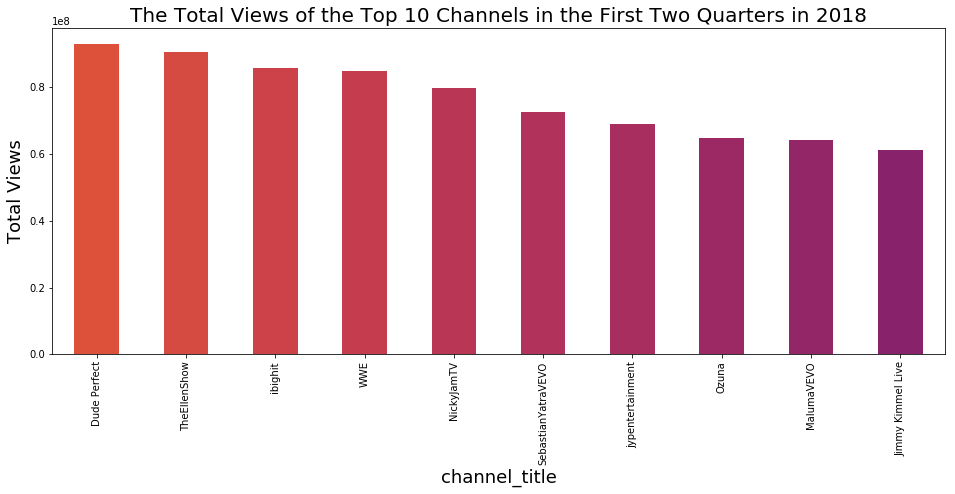

In [23]:
#Colors
color = cm.inferno_r(np.linspace(.4, .8, 17))

#Plot graph
start_time = datetime.datetime.strptime('2018-01-01','%Y-%m-%d').date()
end_time = datetime.datetime.strptime('2018-06-30','%Y-%m-%d').date()
quarters_2018 = you_df_duplicated[(you_df_duplicated.publish_date >= start_time) & (you_df_duplicated.publish_date <= end_time)]
quarters_2018_top_line = quarters_2018.groupby(by = 'channel_title')['views'].sum().sort_values(ascending = False).head(10)
plt.figure(figsize = (16 , 6))
plt.xlabel('Channel Title',fontsize=18)
plt.ylabel('Total Views',fontsize=18)
plt.title('The Total Views of the Top 10 Channels in the First Two Quarters in 2018',fontsize = 20)
quarters_2018_top_line.plot.bar(color = color)

<a id='3.4'><a>

## D. For each category, how long it takes, on average, for a video to become trendy?
We took the the difference of time taken for videos that take most time and videos that take least time to become trending is an average of 50 days. 'Education' videos take the most time whereas 'how to and style' take the least amount of time(in average number of days).

(array([ 0., 10., 20., 30., 40., 50., 60., 70.]),
 <a list of 8 Text yticklabel objects>)

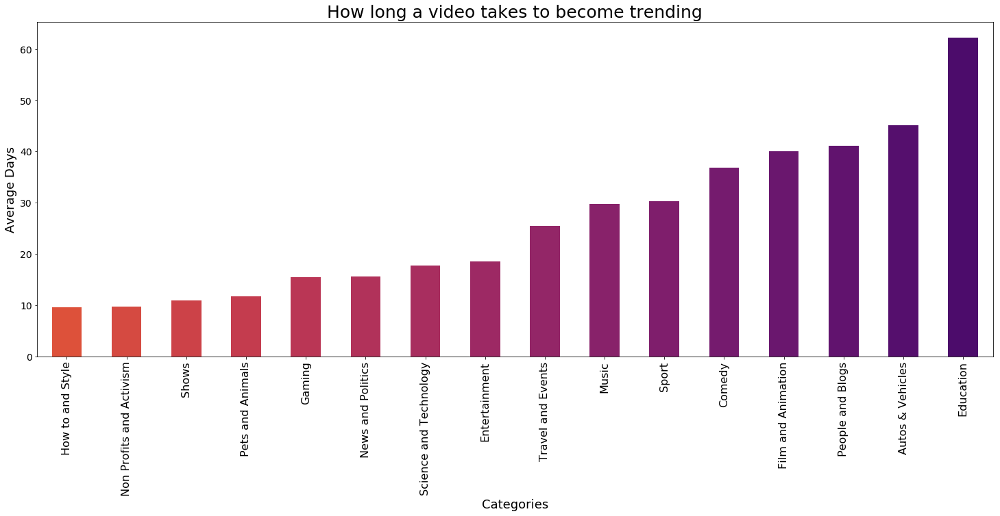

In [24]:
df_1 = you_df.groupby('category_name').mean()['first_publish_to_trending_days'].sort_values().plot.bar(figsize = (25,9),color= color)

#Adjust Legend
params = {'legend.fontsize': 30,
          'legend.handlelength': 2}
plot.rcParams.update(params)

#plot on the graph
plt.title('How long a video takes to become trending', fontsize = 25)
plt.xlabel('Categories', fontsize=18)
plt.ylabel('Average Days', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=14)

<a id='3.5'><a>

## E. How long does a video stay in trending in each category?
We would like to see how long does a video stays in trending for each category so that we can recommend to youtubers to make a certain kind of videos that will be the most trending. From this graph we can see that the amount of time a music video stays in trending is almost double the amount of time for which autos and vehicles video stays in trending. 

(array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14.]),
 <a list of 8 Text yticklabel objects>)

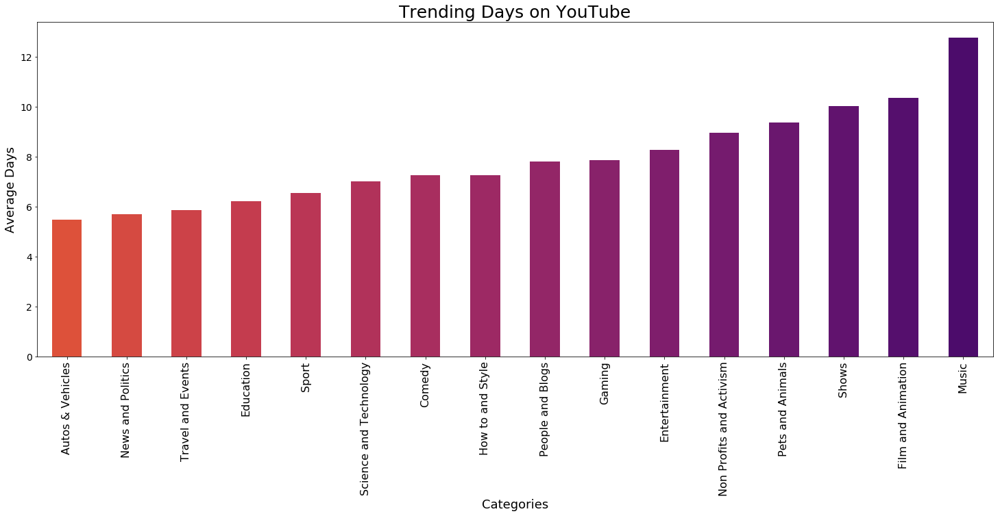

In [25]:
df_1 = you_df.groupby('category_name').mean()['trending_days'].sort_values().plot.bar(figsize = (25,9),color= color)

#Adjust Legend
params = {'legend.fontsize': 30,
          'legend.handlelength': 2}
plot.rcParams.update(params)

#plot on the graph
plt.title('Trending Days on YouTube', fontsize = 25)
plt.xlabel('Categories', fontsize=18)
plt.ylabel('Average Days', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=14)

<a id='3.6'><a>

## F.  What are correlations between dataset variables?
We would like to see how the dataset variables are correlated with each other: for example, we would like to see how views and likes are correlated, meaning do views and likes increase and decrease together (positive correlation)? Does one of them increase when the other decrease and vice versa (negative correlation)? Or are they not correlated?

Correlation is represented as a value between -1 and +1 where +1 denotes the highest positive correlation, -1 denotes the highest negative correlation, and 0 denotes that there is no correlation.

We visualize the correlation table between our dataset variables using a heatmap.

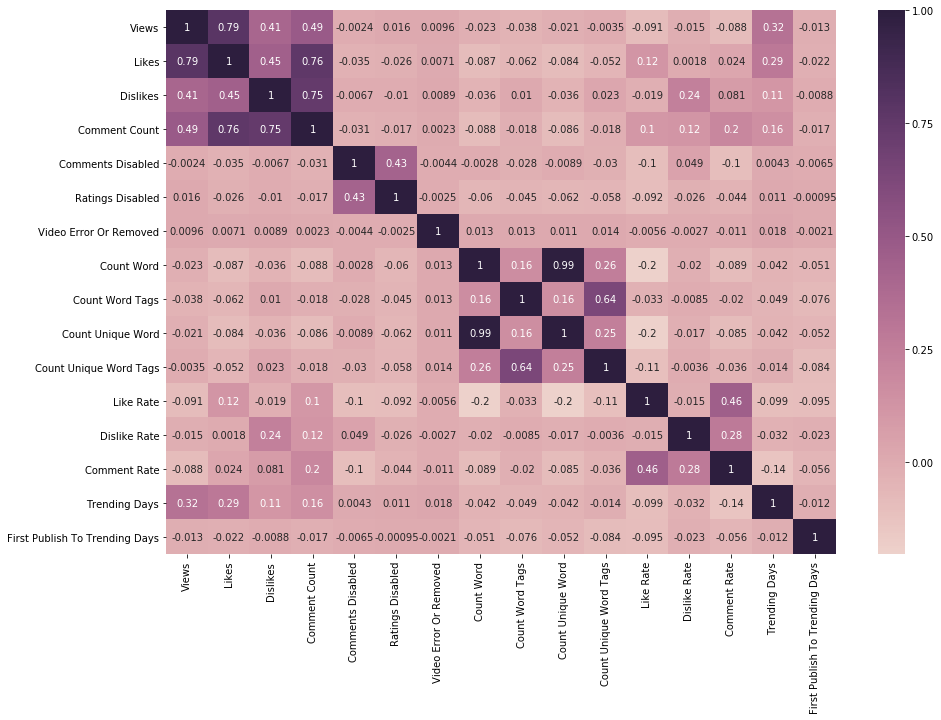

In [26]:
#Take numeric and boolean labels from youtube dataframe and convert label names for plot
h_labels = [
    x.replace('_', ' ').title() for x in list(
        you_df_duplicated.select_dtypes(include=['number', 'bool']).columns.values)
]

# Plot heatmap using correlation between labels of the labels generated above
fig, ax = plt.subplots(figsize=(15, 10))
_ = sns.heatmap(you_df.corr(),
                annot=True,
                xticklabels=h_labels,
                yticklabels=h_labels,
                cmap=sns.cubehelix_palette(as_cmap=True),
                ax=ax)

<a id='3.7'><a>

## G. What does Likes vs dislikes distribution look like?
Ww used log transformation to adjsut the skewness in the rare data. From the graph we can learn that most videos have mroe likes than dislikes.


In [27]:
#Create empty dataframe
in_videos_first = DataFrame()

#Log transformation
in_videos_first['likes_log'] = np.log(you_df['likes'] + 1)
in_videos_first['dislikes_log'] = np.log(you_df['dislikes'] + 1)
hist_data = [
    in_videos_first["dislikes_log"].values, in_videos_first["likes_log"].values
]

group_labels = ['Dislikes log distribution', 'Likes log distribution']
colors = ['#A6ACEC', '#63F5EF']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data,
                         group_labels,
                         colors=colors,
                         bin_size=0.5,
                         show_rug=False)

# Add title
fig['layout'].update(title='Likes vs dislikes', legend=dict(x=0.65, y=0.8))

# Plot!
py.iplot(fig, filename='Hist and Curve')

<a id='3.8'><a>

## H. What are the keywords in trending video's titles?
The words 'Live', 'Late', 'Show' and 'New' seem to be the most popular words that tend to be used in the most popular videos. These can be used if someone wants to increase the chances of their video becoming more popular. We have used a wordcloud to show the results which can be used by new as well as already established youtubers to increase the popularity of their channels.

In [28]:
from wordcloud import WordCloud, STOPWORDS 

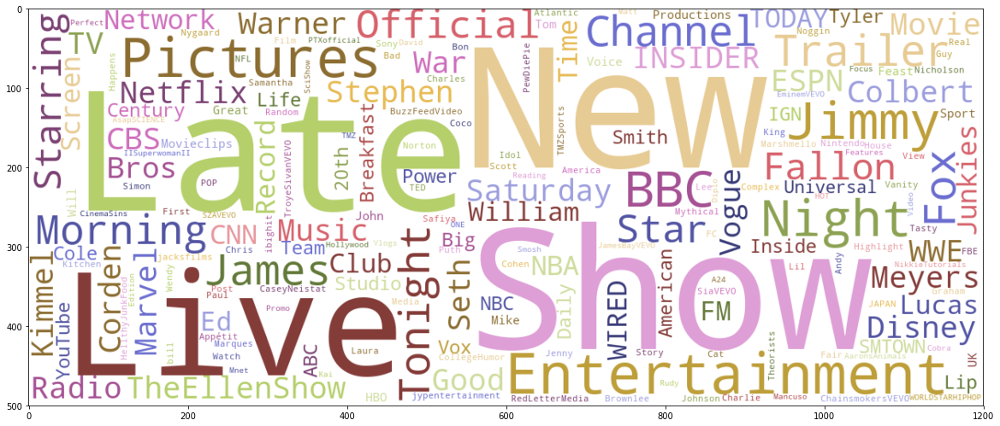

In [29]:
# Creates a list of labels of channel titles
list_Channels = list(you_df['channel_title'])

# Creates the wordcloud plot using the above list
word_cloud= WordCloud(width=1200, height=500, collocations=False, background_color="white", colormap="tab20b").generate(" ".join(list_Channels))
plt.figure(figsize=(20,15))

# Plot!
plt.imshow(word_cloud, interpolation='bilinear')

<a id='4'><a>

# 4. Regression Model
Our focus for this section is on the development of explanatory regression model for YouTube video's trending days, using the statsmodels package. We would like to discover which variables contribute the most to a video's tredning days, and how accurate our multiple linear regression model is to describe the past data.



<a id='4.1'><a>

### A. Correlations between Independent Variables and Tranding Days 
From the previous scetion, we identitied a few relevant explanatory variables that have a strong correlation to videos' trending days, which are:
- views
- likes
- dislikes
- comment_count
- category_rank

The last variable we identitied is the category's ranking from our research question E in last section - how long does a video stay in trending in each category? We assume that videos in certain categories stay trending longer than videos in other categories. Based on our assumption, we numbered the category that stayed trending the longest as 16 and that stayed trending the least as 1.

In [30]:
#Add Category ranking in a new column
category_rank = you_df.groupby('category_name').mean()['trending_days'].sort_values(ascending =False)

#create disctionary
dic = {'Music': 16,
 'Film and Animation': 15,
 'Shows': 14,
 'Pets and Animals': 13,
 'Non Profits and Activism': 12,
 'Entertainment': 11,
 'Gaming': 10,
 'People and Blogs': 9,
 'How to and Style': 8,
 'Comedy': 7,
 'Science and Technology': 6,
 'Sport': 5,
 'Education': 4,
 'Travel and Events': 3,
 'News and Politics': 2,
 'Autos & Vehicles': 1}

#Create a Dataframe for regression model
reg = you_df[['title','trending_days','views', 'likes', 'dislikes', 'comment_count','category_name']]
reg['like_dislike_ratio'] = reg['likes']/reg['dislikes']
reg = reg.replace(dic)
reg.drop_duplicates(subset = 'title', keep = 'last', inplace = True)
reg = reg.drop('title', axis=1)
reg.columns =['trending_days', 'views', 'likes', 'dislikes', 'comment_count','category_rank', 'like_dislike_ratio'] 

#Define a new function
def Correlation(Variable):
    plt.figure(figsize=(7,7))
    plt.plot(reg['trending_days'], reg[Variable], 'k.', alpha=0.5, color='green')
    plt.xlabel('Trending Days')
    plt.ylabel(Variable)
    plt.title('Correlation = %.4f' % reg['trending_days'].corr(reg[Variable]));
    
interact(Correlation, Variable = ['views','likes','dislikes', 'category_rank', 'comment_count']);

interactive(children=(Dropdown(description='Variable', options=('views', 'likes', 'dislikes', 'category_rank',…

<a id='4.2'><a>

### B. Descriptive Statistics
For this part, our objective is to use standard regression output to make inferences about the regression coefficients of views, likes, dislikes, category ranking and comment count in each video for trending days. After multiple attempts, we get an optimal solution with the highest R^2(= 0.611) using the least number of variables. The variables we included in the regression model are:
- log_views
- log_likes	
- log_comment_count
- category_rank

Log Transformation:  
Since our data on video views, likes and comment are right skewed, log tranformations is an apropriate approach to normalize data, and therefore, improves our regression model.

In [31]:
import statsmodels.api as sm

In [32]:
# Set up variables for multiple linear regression model\
y = reg['trending_days']

In [33]:
# Transform numerical variables
x = pd.DataFrame()
x['log_views'] = np.log(reg['views'])
x['log_likes'] = np.log(reg['likes'])
x['log_comment_count'] = np.log(reg['comment_count'])
x['category_rank'] = reg['category_rank']

/Users/linahu/opt/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:853: RuntimeWarning:

divide by zero encountered in log



In [34]:
# Fit linear regression model and report results
x = x.fillna(0)
x = x.replace([np.inf, -np.inf], 0)
model = sm.OLS(endog=y, exog= x)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:          trending_days   R-squared (uncentered):                   0.611
Model:                            OLS   Adj. R-squared (uncentered):              0.611
Method:                 Least Squares   F-statistic:                              3454.
Date:                Thu, 12 Dec 2019   Prob (F-statistic):                        0.00
Time:                        23:48:46   Log-Likelihood:                         -30485.
No. Observations:                8792   AIC:                                  6.098e+04
Df Residuals:                    8788   BIC:                                  6.101e+04
Df Model:                           4                                                  
Covariance Type:            nonrobust                                                  
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
log_views            -0.1573      0.046     -3.417      0.001      -0.247      -0.067
log_likes             0.7045      0.083      8.522      0.000       0.542       0.867
log_comment_count     0.3843      0.071      5.419      0.000       0.245       0.523
category_rank         0.2463      0.021     11.915      0.000       0.206       0.287
==============================================================================
Omnibus:                     3747.206   Durbin-Watson:                   0.786
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            19334.263
Skew:                           2.024   Prob(JB):                         0.00
Kurtosis:                       9.033   Cond. No.                         24.8
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<a id='4.3'><a>

### C. Residuals vs. Fitted Values

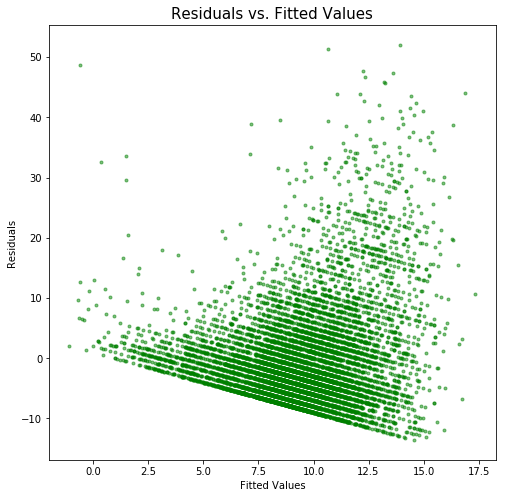

In [35]:
plt.figure(figsize=(8,8))
plt.plot(results.fittedvalues, results.resid, 'k.', alpha=0.5,color='green')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs. Fitted Values',fontsize=15);
    

<a id='5'><a>

# 5. Business Value Matrix

In the busienss value matrix, we used the reverse rank in percentile of each attribute as its score for channels. For example, a channel in top 10% percentile in views, it gets 90 points towards the view attribute in the Business Value matrix. Then we summed up all the scores to get a final score of each channel to evaluate the buesiness value for each video channel and compare this score to thier competitors.

Business Value Matrix Components: 
1. Number of Trending shows 
2. Views
3. Likes
3. Comment
4. Category

Data Normalization:   
Since the range of values of raw data varies widely, our busienss value matrix will not work properly without normalization. Therefore, the range of all attributes should be normalized so that each attributes contributes approximately proportionately to the final business score. Z-score normalization has been applied to all five attributes.

In [36]:
#add 'channel_title' as index to x DataFrame
x.index = you_df_duplicated['channel_title']

In [37]:
# mean 'Views', 'Likes', 'Comment', 'Category', 'Trending Videos' for each channel
x_mean = x.groupby('channel_title').mean()
matrix = pd.DataFrame()

In [38]:
#Z-score normalization

#Views 
matrix['views_std'] = (x_mean['log_views'] - x_mean['log_views'].mean()) / (x_mean['log_views'].std())

#likes 
matrix['likes_std'] = (x_mean['log_likes'] - x_mean['log_likes'].mean()) / (x_mean['log_likes'].std())

#comment_counts
matrix['comment_count_std'] = (x_mean['log_comment_count'] - x_mean['log_comment_count'].mean()) / (x_mean['log_comment_count'].std())

#category_rank 
matrix['category_rank'] = (x_mean['category_rank'] - x_mean['category_rank'].mean()) / (x_mean['category_rank'].std())

#number of Trending Shows 
matrix['number_of_trending_videos'] = x.groupby('channel_title')['log_views'].count()
matrix['number_of_trending_videos'] = (matrix['number_of_trending_videos'] - matrix['number_of_trending_videos'].mean()) / (matrix['number_of_trending_videos'].std())


In [39]:
#Create a funtion that generates spider maps for two video channels.
def spider(Channel1, Channel2):
    
    global matrix
    
    #rename columns
    matrix.columns = ['Views', 'Likes', 'Comment', 'Category', 'Trending Videos']
    
    # Set data
    plt.figure(figsize=(8,8))
    df = matrix.applymap(lambda x: st.norm.cdf(x)*100)

    # number of variable
    categories=list(df)[:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(111, polar=True)

    # Draw one axe per variable + add labels
    plt.xticks(angles[:-1], categories, color='grey', size=14)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([20,40,60,80], ["20","40","60","80"], size=12)
    plt.ylim(0,100)
    plt.title((Channel1+' vs. '+ Channel2),fontsize=20, color='black')
    ax.tick_params(direction='out', pad=18)
    
    # Plot each individual = each line of the data
    # I don't do a loop, because plotting more than 3 groups makes the chart unreadable

    # Ind1
    values=df.loc[Channel1].values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color= 'green', linewidth=1, linestyle='solid', label=Channel1)
    ax.fill(angles, values,'g', alpha=0.1)

    
    # Ind2
    values=df.loc[Channel2].values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values,  color= 'red',linewidth=1, label=Channel2)
    ax.fill(angles, values, 'r', alpha=0.1)
    
    # Add legend
    plt.legend(loc='upper right', bbox_to_anchor=(1.4, 1),prop={'size': 14})

#Create Interactive View
interact(spider, Channel1 = list(matrix.index), Channel2 = list(matrix.index));

interactive(children=(Dropdown(description='Channel1', options=('- camilla', '09W HYPE', '12 News', '14,999,99…

<a id='6'><a>

# 6. Conclusion

From this report, we can see that if an advertisor or investor wants to put his/her advertisement on the youtube, they should focus on the music and entertainment category since these two categories tends to receive the most views, likes, comments. Therefore, these two categories have higher business value or ROI for an advertisor and investor according to our business value matrix. 

For new youtubers who want to build his/her channel/brand and have impact on YouTube quickly, we suggest them have a bold foray into Science and Technology category and the Show category. According to our visualization, videos in these two channels' videos take the shortest amount of time to become a trending videos on average. As a result, these two categories are the great opportunities for the newcomers. 

What's more, according to our wordcloud, we also recommand the furture youtubers to use 'Late', 'Show', 'New' and 'Live' as the keywords to attract more users to watch their videos, because these keywords showing up among the trending videos most frequently.

Lastly, our regression model can help Youtube's developers and engineers to predict the potential trending video using the number of likes, views, comment and category rank as attributes for recommendation algorithm.
<a id='7'><a>

# 7. Reference
1. https://www.kaggle.com/quannguyen135/what-is-trending-on-youtube-eda-with-python
2. https://www.kaggle.com/hoonkeng/deep-analysis-on-youtube-trending-videos-eda
2. https://www.kaggle.com/bvc5283/business-insights-developed-from-youtube-channels#Conclusion
2. https://ipywidgets.readthedocs.io/en/latest/examples/Using%20Interact.html
3. https://python-graph-gallery.com/391-radar-chart-with-several-individuals/
4. https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html